In [1]:
import pandas as pd
#import geopandas as gpd
import re
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
import plotly.express as px
import os


(array([572., 432.,  98.,  61.,  31.,  22.,  16.,  86.]),
 array([   20,   100,   500,  1000,  2000,  3000,  4000,  5000, 10000]),
 <BarContainer object of 8 artists>)

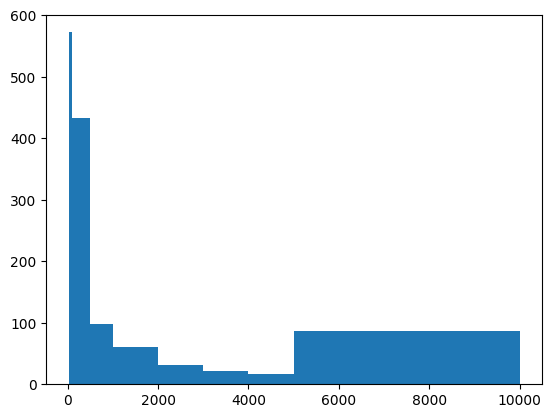

In [6]:
df = pd.read_csv('cleaned_datasets\herring_catches_2020.csv')
plt.hist(df['Rundvekt'], [20,100,500, 1000,2000, 3000, 4000, 5000, 10000])

In [2]:

#change this function to store different data
def read_and_store_herring_data(year):
    if year == 2021:
        string = 'fangstdata\S_DR_FANGST_ERS_DCA_FARTOY_2021_PR_2022-03-07.csv'
    else:
        string ='fangstdata\elektronisk-rapportering-ers-' + str(year) + '-fangstmelding-dca.csv'
    catch_data = pd.read_csv(string,delimiter=';', on_bad_lines='skip', encoding='utf8')
    herring_catches = catch_data.loc[catch_data['Sildebestand'] == 'Norsk vårgytende sild']
    herring_catches = herring_catches.loc[herring_catches['Rundvekt'] > 100]
    latitude_start = pd.to_numeric([pos.replace(',','.') for pos in herring_catches['Startposisjon bredde']])
    longitude_start = pd.to_numeric([pos.replace(',','.') for pos in herring_catches['Startposisjon lengde']])
    latitude_stopp = pd.to_numeric([pos.replace(',','.') for pos in herring_catches['Stopposisjon bredde']])
    longitude_stopp = pd.to_numeric([pos.replace(',','.') for pos in herring_catches['Stopposisjon lengde']])
    fangststart = pd.to_numeric([klokkeslett.split(':')[0] for klokkeslett in herring_catches['Startklokkeslett']])
    fangstslutt = pd.to_numeric([klokkeslett.split(':')[0] for klokkeslett in herring_catches['Stoppklokkeslett']])
    Registreringsmerke = herring_catches['Registreringsmerke']
    for i in range(len(fangststart)):
        if fangststart[i] > fangstslutt[i]:
            fangstslutt[i] = 23 #this ensures that in case the catch happens overnight, i simplify the data so other functions dont get confuses.
    longitude = (longitude_start + longitude_stopp) /2
    latitude = (latitude_start+ latitude_stopp)/2
    Rundvekt = pd.to_numeric([vekt for vekt in herring_catches['Rundvekt']])
    day = pd.to_numeric([date.split('.')[0] for date in herring_catches['Startdato']])
    month = pd.to_numeric([date.split('.')[1] for date in herring_catches['Startdato']]) 
    catch_year = pd.to_numeric([date.split('.')[2] for date in herring_catches['Startdato']])


    
    data = {'longitude': longitude,
        'latitude': latitude,
        'latitude_start' : latitude_start,
        'longitude_start' : longitude_start,
        'latitude_stopp' : latitude_stopp,
        'longitude_stopp' : longitude_stopp,
        'Rundvekt': Rundvekt,
        'fangststart' : fangststart,
        'fangstslutt' : fangstslutt,
        'day' : day,
        'month': month,
        'year':  catch_year,
        'Registreringsmerke': Registreringsmerke
    }
    df = pd.DataFrame(data)


    '''
    last_line = df.iloc[1]
    idxes_to_drop = []
    for idx, row in df.iterrows():
        if idx == 0 or idx == 1: # or last_line == None or last_line.empty(): 
            last_line = row
            continue
        if row['Registreringsmerke'] == last_line['Registreringsmerke'] and \
            row['latitude'] == last_line['latitude'] and \
                row['longitude'] == last_line['longitude'] and \
                    row['day'] == last_line['day'] and \
                        row['fangststart'] == last_line['fangststart'] and \
                            row['fangstslutt'] == last_line['fangstslutt']: 
                                print(idx)
                                df.iloc[idx -1]['Rundvekt'] += row['Rundvekt']
                                idxes_to_drop.append(idx)

        last_line = row
    df.drop(idxes_to_drop, axis='index') '''
    df.to_csv('cleaned_datasets/herring_catches_'+str(year)+'.csv')


for year in range(2021, 2022):
    if year in []: pass
    read_and_store_herring_data(year)

C:\Users\evenasm\AppData\Local\Temp\ipykernel_2640\2479529192.py:7: DtypeWarning: Columns (77,78) have mixed types. Specify dtype option on import or set low_memory=False.
  catch_data = pd.read_csv(string,delimiter=';', on_bad_lines='skip', encoding='utf8')
C:\Users\evenasm\AppData\Local\Temp\ipykernel_2640\2479529192.py:7: DtypeWarning: Columns (51,77,78) have mixed types. Specify dtype option on import or set low_memory=False.
  catch_data = pd.read_csv(string,delimiter=';', on_bad_lines='skip', encoding='utf8')
C:\Users\evenasm\AppData\Local\Temp\ipykernel_2640\2479529192.py:7: DtypeWarning: Columns (51,83,90) have mixed types. Specify dtype option on import or set low_memory=False.
  catch_data = pd.read_csv(string,delimiter=';', on_bad_lines='skip', encoding='utf8')
C:\Users\evenasm\AppData\Local\Temp\ipykernel_2640\2479529192.py:7: DtypeWarning: Columns (51,83,90) have mixed types. Specify dtype option on import or set low_memory=False.
  catch_data = pd.read_csv(string,delimite

In [11]:
fangst_data_2018 = pd.read_csv('cleaned_datasets/herring_catches_2018.csv', on_bad_lines='skip', encoding='utf8')
fangst_data_2019 = pd.read_csv('cleaned_datasets/herring_catches_2019.csv', on_bad_lines='skip', encoding='utf8')
fangst_data_2020 = pd.read_csv('cleaned_datasets/herring_catches_2020.csv', on_bad_lines='skip', encoding='utf8')
fangst_data = []
for year in range(2021,2022): 
    fangst_data.append(pd.read_csv('cleaned_datasets/herring_catches_'+str(year)+'.csv', on_bad_lines='skip', encoding='utf8'))
#print(fangst_data_2018.head)
#fangst_data_2018.merge(fangst_data_2019)
#fangst_data_2018.merge(fangst_data_2020)
#print(fangst_data_2018.head)
fangst_totalt = pd.concat(fangst_data)

fangst_desember = fangst_totalt.loc[fangst_totalt['month'] ==12]
fangst_januar = fangst_totalt.loc[fangst_totalt['month'] == 1]
fangst_desember_og_januar = pd.concat([fangst_desember, fangst_januar])



In [17]:
#for i in range(len(Rundvekt)):
#    if Rundvekt[i] == 0:
#        Rundvekt[i] = 1
#plotter = {'latitude' : latitude, 'longitude': longitude, 'Rundvekt':Rundvekt, 'month': month}

#fig = px.density_mapbox(plotter, lat='longitude', lon='latitude',mapbox_style='stamen-terrain', opacity=.7, radius=5, title="Sildefangst 2018")
def scatterplot_on_map(df, _title, _color):
    fig = px.scatter_mapbox(df, lon='longitude', lat='latitude',color=_color,# size='Rundvekt',
        center=dict(lat=65, lon=10),mapbox_style='stamen-terrain', title=_title,
        height=1000, zoom=4)

    fig.show()


<h3>Noen interessante plots kommer her, først,  et plott over 3 år med desember/januarfangst. Legg merke til 3 samlinger: <h3>

-  Kvænangen (Troms og Finnmark)
-  Til havs vest for Bodø
-  Mellom orknaøyene og Bergen (minst insidens)

In [18]:

scatterplot_on_map(fangst_januar, 'Sildefangst desember/januar 2011-2020', 'year')

     Unnamed: 0  longitude  latitude  latitude_start  longitude_start  \
0             0    18.1195   69.5185          69.127           16.076   
1             1    16.0855   69.1430          69.144           16.084   
2             2    14.7690   68.9735          68.973           14.766   
3             3    16.0960   69.1380          69.138           16.096   
4             4    14.4545   68.8785          68.858           14.398   
...         ...        ...       ...             ...              ...   
1094       1094     9.3915   66.6330          66.633            9.200   
1095       1095    10.3170   66.6915          66.550           10.417   
1096       1096     9.6610   66.8430          66.766            9.692   
1097       1097     9.8680   66.8050          66.684            9.763   
1102       1102    10.4165   66.4915          66.483           10.483   

      latitude_stopp  longitude_stopp  Rundvekt fangststart fangstslutt day  \
0             69.910           20.163  11500

<h3> Deretter har vi generell sildefangst per år, 2018, 2019 og 2020: </h3>

In [23]:
scatterplot_on_map(fangst_data_2018, 'Sildefangst 2018', 'month')

In [90]:
scatterplot_on_map(fangst_data_2019, 'Sildefangst 2019', 'month')

In [91]:
scatterplot_on_map(fangst_data_2020, 'Sildefangst 2020', 'month')

<h3> Total sildefangst over alle måneder i 3 år, farget etter år: </h3>

In [19]:
scatterplot_on_map(fangst_totalt, "Total fangst 2011-2020", 'year')

<h3> Total sildefangst 18/19/20, farget etter måned: </h3>

In [22]:
scatterplot_on_map(fangst_totalt, 'Sildefangst 2011-2020', 'month')

In [12]:
df = pd.read_csv('fangstdata\elektronisk-rapportering-ers-2018-fangstmelding-dca.csv',delimiter=';', on_bad_lines='skip', encoding='utf8')


C:\Users\evenasm\AppData\Local\Temp\ipykernel_8652\3340441708.py:1: DtypeWarning:

Columns (51,83,90) have mixed types. Specify dtype option on import or set low_memory=False.



Relevant år
Meldingsår
Meldingstype (kode)
Meldingstype
Meldingsnummer
Meldingsversjon
Sekvensnummer
Melding ID
Meldingstidspunkt
Meldingsdato
Meldingsklokkeslett
Radiokallesignal (ERS)
Fartøynavn (ERS)
Registreringsmerke (ERS)
Fartøynasjonalitet (kode)
Fartøygruppe (kode)
Fartøygruppe
Kvotetype (kode)
Kvotetype
Aktivitet (kode)
Aktivitet
Havn (kode)
Havn
Havn nasjonalitet
Starttidspunkt
Startdato
Startklokkeslett
Startposisjon bredde
Startposisjon lengde
Hovedområde start (kode)
Hovedområde start
Lokasjon start (kode)
Sone (kode)
Sone
Områdegruppering start (kode)
Områdegruppering start
Havdybde start
Stopptidspunkt
Stoppdato
Stoppklokkeslett
Varighet
Fangstår
Stopposisjon bredde
Stopposisjon lengde
Hovedområde stopp (kode)
Hovedområde stopp
Lokasjon stopp (kode)
Områdegruppering stopp (kode)
Områdegruppering stopp
Havdybde stopp
Trekkavstand
Pumpet fra fartøy
Redskap FAO (kode)
Redskap FAO
Redskap FDIR (kode)
Redskap FDIR
Redskap - gruppe (kode)
Redskap - gruppe
Redskap - hovedgruppe

In [21]:
#for column in df.columns:print(column)
for bestand in df['Sildebestand']: 
    #print(type(bestand))
    if isinstance(bestand, float):  print(bestand)

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
